In [4]:
"""
FIX: Copier les fichiers du dataset vers /kaggle/working/
================================================================================
Les fichiers uploadés sont dans /kaggle/input/fusionnn/
Il faut les copier dans /kaggle/working/ pour que le code les trouve
================================================================================
"""

import os
import shutil

print("="*80)
print("📁 COPIE DES FICHIERS")
print("="*80)

# Chemin source (ton dataset uploadé)
SOURCE_DIR = '/kaggle/input/fusion-models/'

# Chemin destination
DEST_DIR = '/kaggle/working/'

# Liste des fichiers à copier
files_to_copy = [
    'best_ef_model.pth',
    'best_video_model.pth',
    'ef_scaler_tabular.pkl',
    'preprocessing_config_v2.json',
    'best_fusion_phase1_final.pth'
]

print(f"\n📂 Source: {SOURCE_DIR}")
print(f"📂 Destination: {DEST_DIR}\n")

# Copier chaque fichier
for filename in files_to_copy:
    source_path = os.path.join(SOURCE_DIR, filename)
    dest_path = os.path.join(DEST_DIR, filename)
    
    if os.path.exists(source_path):
        shutil.copy2(source_path, dest_path)
        size_mb = os.path.getsize(dest_path) / (1024**2)
        print(f"✅ {filename:<35} ({size_mb:>8.2f} MB)")
    else:
        print(f"❌ {filename:<35} - NON TROUVÉ dans {SOURCE_DIR}")

print("\n" + "="*80)
print("✅ COPIE TERMINÉE!")
print("="*80)
print("\n➡️  Maintenant, réexécute le code de la Partie 1")
print("="*80)

📁 COPIE DES FICHIERS

📂 Source: /kaggle/input/fusion-models/
📂 Destination: /kaggle/working/

✅ best_ef_model.pth                   (    0.22 MB)
✅ best_video_model.pth                (  360.33 MB)
✅ ef_scaler_tabular.pkl               (    0.00 MB)
✅ preprocessing_config_v2.json        (    0.00 MB)
✅ best_fusion_phase1_final.pth        (  123.33 MB)

✅ COPIE TERMINÉE!

➡️  Maintenant, réexécute le code de la Partie 1


🔍 GRAD-CAM POUR MODÈLE FUSION
🖥️  Device: cuda

✅ Architectures définies

📥 CHARGEMENT DU MODÈLE FUSION

🔧 Création des branches vidéo et EF...
✅ Branches chargées
🔧 Création du modèle fusion...
✅ Modèle fusion chargé et prêt
   Val F1: 0.9906
   Balance Score: 0.996
   Video Attn: 0.496
   EF Attn: 0.504

🔍 APPLICATION GRAD-CAM SUR TEST SET

📊 Analyse de 5 échantillons...

Sample #1 (Index 50)
📋 RÉSULTATS:
   EF: 31.1%
   True Label:  Unhealthy
   Prediction:  Unhealthy ✅
   Attention:
      Video: 1.57%
      EF:    98.43%


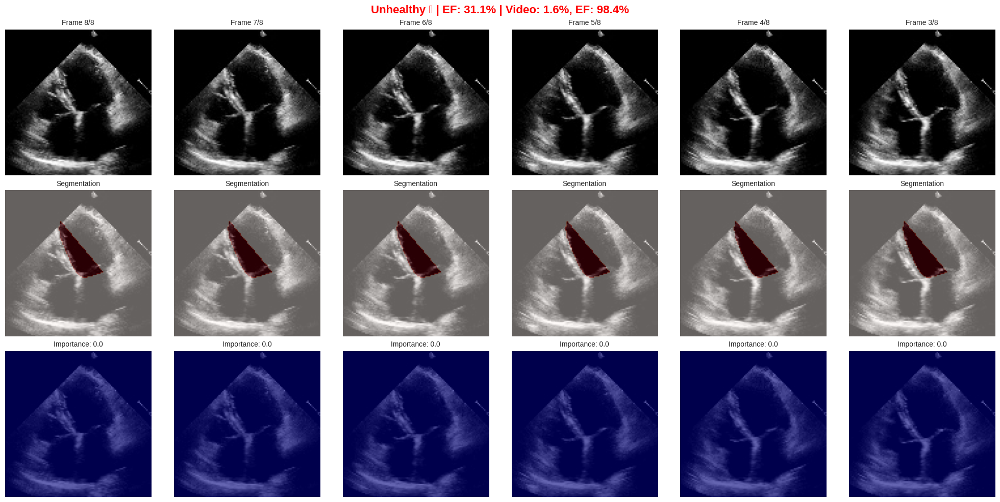

✅ Visualisation sauvegardée: gradcam_sample_50.png

Sample #2 (Index 700)
📋 RÉSULTATS:
   EF: 57.7%
   True Label:  Healthy
   Prediction:  Healthy ✅
   Attention:
      Video: 50.18%
      EF:    49.82%


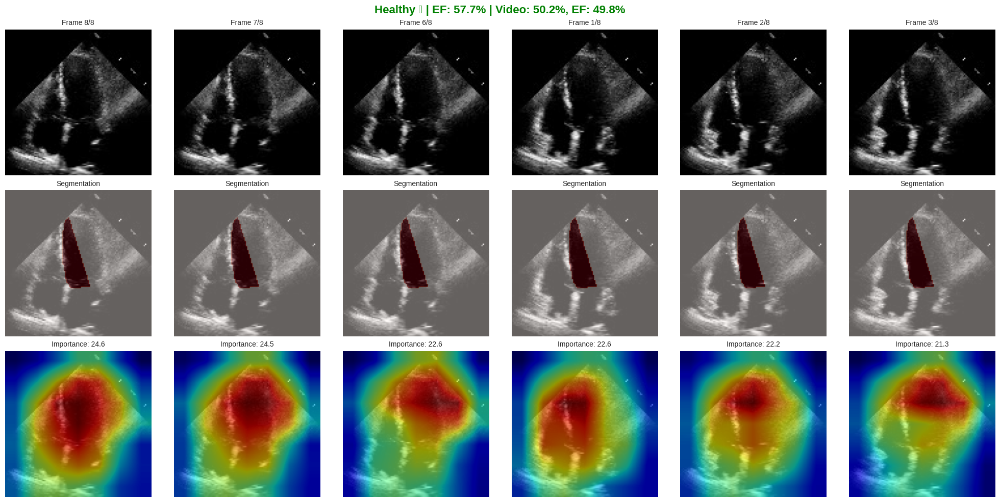

✅ Visualisation sauvegardée: gradcam_sample_700.png

Sample #3 (Index 80)
📋 RÉSULTATS:
   EF: 69.7%
   True Label:  Healthy
   Prediction:  Healthy ✅
   Attention:
      Video: 92.71%
      EF:    7.29%


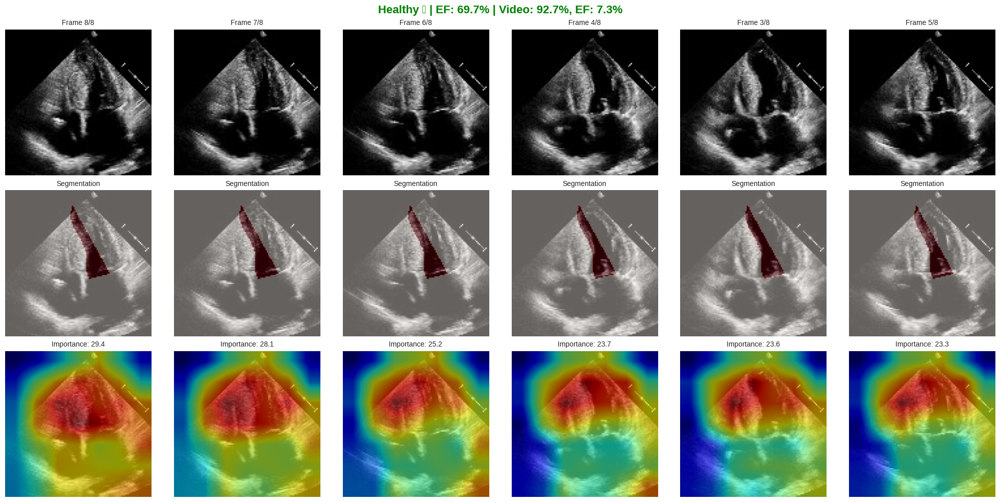

✅ Visualisation sauvegardée: gradcam_sample_80.png

Sample #4 (Index 480)
📋 RÉSULTATS:
   EF: 31.4%
   True Label:  Unhealthy
   Prediction:  Unhealthy ✅
   Attention:
      Video: 1.56%
      EF:    98.44%


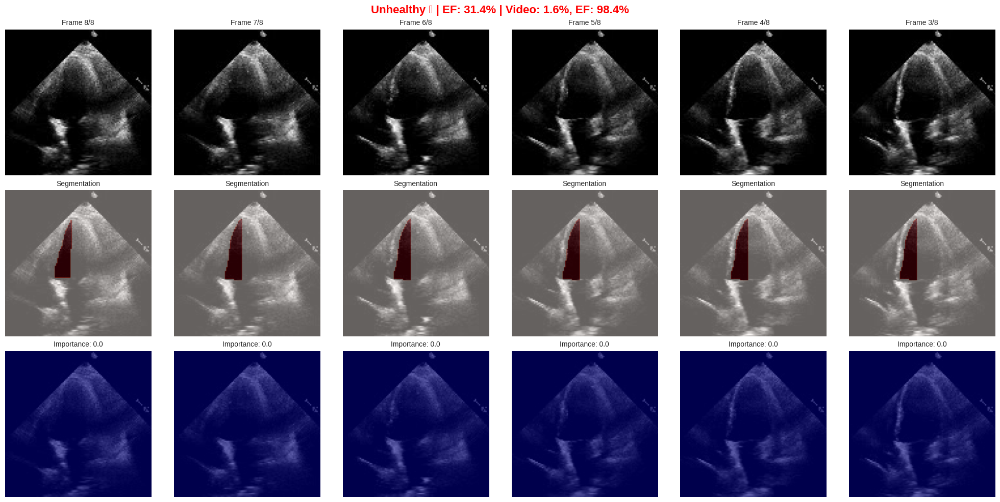

✅ Visualisation sauvegardée: gradcam_sample_480.png

Sample #5 (Index 1200)
📋 RÉSULTATS:
   EF: 67.8%
   True Label:  Healthy
   Prediction:  Healthy ✅
   Attention:
      Video: 88.84%
      EF:    11.16%


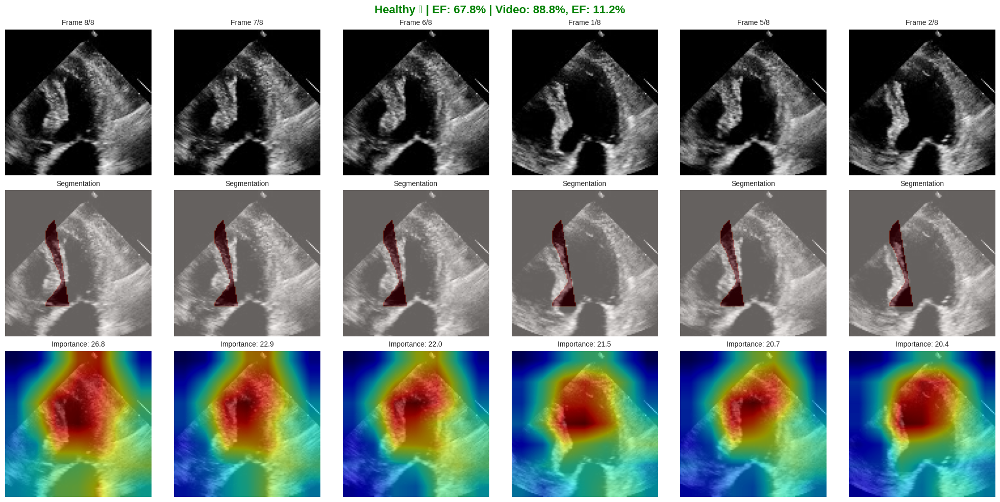

✅ Visualisation sauvegardée: gradcam_sample_1200.png

✅ GRAD-CAM TERMINÉ!

📊 5 visualisations générées
📁 Fichiers: gradcam_sample_*.png

💡 Pour analyser d'autres samples:
   Change la liste: test_indices = [0, 10, 50, 100, 200]


In [22]:
"""
GRAD-CAM POUR TON MODÈLE DE FUSION DÉJÀ ENTRAÎNÉ
Version finale - utilise best_fusion_phase1_final.pth
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models.video as video_models
import numpy as np
import matplotlib.pyplot as plt
import cv2
import joblib

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("="*70)
print("🔍 GRAD-CAM POUR MODÈLE FUSION")
print("="*70)
print(f"🖥️  Device: {device}\n")

# =============================================================================
# 1. ARCHITECTURES (copie exacte du Document 4)
# =============================================================================

class SpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.conv = nn.Conv3d(in_channels + 1, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, features, masks):
        if masks.shape[-2:] != features.shape[-2:]:
            masks = F.interpolate(
                masks.view(masks.size(0), 1, -1, masks.size(-2), masks.size(-1)),
                size=features.shape[-3:], mode='trilinear', align_corners=False
            )
        combined = torch.cat([features, masks], dim=1)
        attention = self.sigmoid(self.conv(combined))
        return features * attention


class VideoModelWithSegmentation(nn.Module):
    def __init__(self, num_classes=2, pretrained=True, dropout=0.5):
        super().__init__()
        self.backbone = video_models.r2plus1d_18(pretrained=pretrained)
        self.backbone.stem[0] = nn.Conv3d(1, 45, kernel_size=(1,7,7),
                                          stride=(1,2,2), padding=(0,3,3), bias=False)
        self.attention = SpatialAttention(in_channels=64)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()
        
        self.classifier = nn.Sequential(
            nn.Linear(in_features, 256), nn.ReLU(), nn.BatchNorm1d(256), nn.Dropout(dropout),
            nn.Linear(256, 128), nn.ReLU(), nn.BatchNorm1d(128), nn.Dropout(dropout*0.5),
            nn.Linear(128, num_classes)
        )
        
        self.intermediate_features = None
        def hook_fn(module, input, output):
            self.intermediate_features = output
        self.backbone.layer1.register_forward_hook(hook_fn)
    
    def forward(self, video, masks, return_features=False):
        x = video.permute(0, 2, 1, 3, 4)
        masks = masks.permute(0, 2, 1, 3, 4)
        x = self.backbone.stem(x)
        x = self.backbone.layer1(x)
        x = self.attention(x, masks)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)
        x = self.backbone.avgpool(x)
        features = x.flatten(1)
        logits = self.classifier(features)
        if return_features:
            return logits, features
        return logits


class EFBranch(nn.Module):
    def __init__(self, num_classes=2, dropout=0.5):
        super().__init__()
        self.ef_branch = nn.Sequential(
            nn.Linear(1, 64), nn.ReLU(), nn.BatchNorm1d(64), nn.Dropout(dropout),
            nn.Linear(64, 128), nn.ReLU(), nn.BatchNorm1d(128), nn.Dropout(dropout),
            nn.Linear(128, 64), nn.ReLU(), nn.BatchNorm1d(64), nn.Dropout(dropout*0.5),
            nn.Linear(64, num_classes)
        )
    
    def forward(self, ef, return_features=False):
        ef = ef.unsqueeze(1)
        if return_features:
            x = ef
            for i, layer in enumerate(self.ef_branch):
                x = layer(x)
                if i == len(self.ef_branch) - 2:
                    features = x
            logits = self.ef_branch[-1](features)
            return logits, features
        return self.ef_branch(ef)


class SoftBalancedCrossModalAttention(nn.Module):
    def __init__(self, video_dim=512, ef_dim=64, hidden_dim=128):
        super().__init__()
        self.video_proj = nn.Linear(video_dim, hidden_dim)
        self.ef_proj = nn.Linear(ef_dim, hidden_dim)
        self.attention_score = nn.Linear(hidden_dim, 1)
    
    def forward(self, video_features, ef_features):
        video_proj = self.video_proj(video_features)
        ef_proj = self.ef_proj(ef_features)
        
        video_score = self.attention_score(torch.tanh(video_proj))
        ef_score = self.attention_score(torch.tanh(ef_proj))
        
        scores = torch.cat([video_score, ef_score], dim=1)
        attention_weights = F.softmax(scores, dim=1)
        
        attended_video = video_features * attention_weights[:, 0:1]
        attended_ef = ef_features * attention_weights[:, 1:2]
        
        return attended_video, attended_ef, attention_weights


class OptimizedMultimodalFusion(nn.Module):
    def __init__(self, video_model, ef_model, num_classes=2, dropout=0.5):
        super().__init__()
        self.video_branch = video_model
        self.ef_branch = ef_model
        self.cross_attention = SoftBalancedCrossModalAttention(512, 64, 128)
        
        self.fusion_classifier = nn.Sequential(
            nn.Linear(576, 256), nn.ReLU(), nn.BatchNorm1d(256), nn.Dropout(dropout),
            nn.Linear(256, 128), nn.ReLU(), nn.BatchNorm1d(128), nn.Dropout(dropout*0.5),
            nn.Linear(128, 64), nn.ReLU(), nn.BatchNorm1d(64), nn.Dropout(dropout*0.25),
            nn.Linear(64, num_classes)
        )
    
    def forward(self, video, masks, ef):
        video_logits, video_features = self.video_branch(video, masks, return_features=True)
        ef_logits, ef_features = self.ef_branch(ef, return_features=True)
        
        attended_video, attended_ef, attention_weights = self.cross_attention(
            video_features, ef_features
        )
        
        fused_features = torch.cat([attended_video, attended_ef], dim=1)
        fusion_logits = self.fusion_classifier(fused_features)
        
        return fusion_logits, video_logits, ef_logits, attention_weights


print("✅ Architectures définies\n")

# =============================================================================
# 2. CHARGER LE MODÈLE FUSION
# =============================================================================

print("="*70)
print("📥 CHARGEMENT DU MODÈLE FUSION")
print("="*70)

# 1. Créer les branches vides
print("\n🔧 Création des branches vidéo et EF...")
video_model = VideoModelWithSegmentation(num_classes=2, pretrained=False, dropout=0.5)
ef_model = EFBranch(num_classes=2, dropout=0.5)

# 2. Charger les poids des branches
video_ckpt = torch.load('best_video_model.pth', map_location=device, weights_only=False)
video_model.load_state_dict(video_ckpt['model_state_dict'])

ef_ckpt = torch.load('best_ef_model.pth', map_location=device, weights_only=False)
ef_model.load_state_dict(ef_ckpt['model_state_dict'])

print("✅ Branches chargées")

# 3. Créer le modèle fusion
print("🔧 Création du modèle fusion...")
fusion_model = OptimizedMultimodalFusion(
    video_model, ef_model, num_classes=2, dropout=0.5
).to(device)

# 4. Charger les poids du modèle fusion
fusion_ckpt = torch.load('best_fusion_phase1_final.pth', map_location=device, weights_only=False)
fusion_model.load_state_dict(fusion_ckpt['model_state_dict'])
fusion_model.eval()

print("✅ Modèle fusion chargé et prêt")
print(f"   Val F1: {fusion_ckpt['val_f1']:.4f}")
print(f"   Balance Score: {fusion_ckpt['balance_score']:.3f}")
print(f"   Video Attn: {fusion_ckpt['video_attn']:.3f}")
print(f"   EF Attn: {fusion_ckpt['ef_attn']:.3f}\n")

# =============================================================================
# 3. GRAD-CAM
# =============================================================================

class GradCAM:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.activations = None
        
        # Hook sur layer4 de la branche vidéo
        target_layer = model.video_branch.backbone.layer4
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_backward_hook(self._save_gradient)
    
    def _save_activation(self, module, input, output):
        self.activations = output.detach()
    
    def _save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()
    
    def generate(self, video, masks, ef):
        """Génère la heatmap Grad-CAM"""
        self.model.eval()
        
        # Forward
        logits, _, _, attention = self.model(video, masks, ef)
        pred_class = logits.argmax(dim=1).item()
        
        # Backward
        self.model.zero_grad()
        one_hot = torch.zeros_like(logits)
        one_hot[0, pred_class] = 1
        logits.backward(gradient=one_hot, retain_graph=True)
        
        # Calcul Grad-CAM
        weights = self.gradients.mean(dim=(2, 3, 4), keepdim=True)
        cam = (weights * self.activations).sum(dim=1)
        cam = F.relu(cam).squeeze(0)  # [T, H, W]
        
        # Normaliser par frame
        for t in range(cam.shape[0]):
            if cam[t].max() > 0:
                cam[t] = (cam[t] - cam[t].min()) / (cam[t].max() - cam[t].min())
        
        return cam.cpu().numpy(), pred_class, attention.detach().cpu().numpy()


def visualize_gradcam(video, masks, cam, prediction, ef_value, attention, save_name):
    """Visualise les 6 frames les plus importantes"""
    T = cam.shape[0]
    importance = cam.reshape(T, -1).sum(axis=1)
    top_frames = np.argsort(importance)[-6:][::-1]
    
    fig, axes = plt.subplots(3, 6, figsize=(20, 10))
    
    for i, frame_idx in enumerate(top_frames):
        # 1. Frame originale
        frame = video[0, frame_idx, 0].cpu().numpy()
        axes[0, i].imshow(frame, cmap='gray')
        axes[0, i].set_title(f'Frame {frame_idx+1}/{T}', fontsize=10)
        axes[0, i].axis('off')
        
        # 2. Segmentation
        mask = masks[0, frame_idx, 0].cpu().numpy()
        axes[1, i].imshow(frame, cmap='gray')
        axes[1, i].imshow(mask, cmap='Reds', alpha=0.4)
        axes[1, i].set_title('Segmentation', fontsize=10)
        axes[1, i].axis('off')
        
        # 3. Grad-CAM
        cam_frame = cv2.resize(cam[frame_idx], (frame.shape[1], frame.shape[0]))
        axes[2, i].imshow(frame, cmap='gray')
        axes[2, i].imshow(cam_frame, cmap='jet', alpha=0.6)
        axes[2, i].set_title(f'Importance: {importance[frame_idx]:.1f}', fontsize=10)
        axes[2, i].axis('off')
    
    # Titre
    pred_label = 'Healthy ✓' if prediction == 1 else 'Unhealthy ✗'
    color = 'green' if prediction == 1 else 'red'
    title = f'{pred_label} | EF: {ef_value:.1f}% | Video: {attention[0,0]:.1%}, EF: {attention[0,1]:.1%}'
    plt.suptitle(title, fontsize=16, fontweight='bold', color=color)
    
    plt.tight_layout()
    plt.savefig(save_name, dpi=200, bbox_inches='tight')
    plt.show()
    
    print(f"✅ Visualisation sauvegardée: {save_name}\n")


# =============================================================================
# 4. APPLICATION SUR TEST SAMPLES
# =============================================================================

print("="*70)
print("🔍 APPLICATION GRAD-CAM SUR TEST SET")
print("="*70)

# Charger scaler EF
ef_scaler = joblib.load('ef_scaler_tabular.pkl')

# Initialiser Grad-CAM
gradcam = GradCAM(fusion_model)

# Tester sur plusieurs samples
test_indices = [50, 700, 80, 480, 1200]  # 0, 20, 40, 60, ...
print(f"\n📊 Analyse de {len(test_indices)} échantillons...\n")

for sample_idx, idx in enumerate(test_indices):
    if idx >= len(test_dataset):
        print(f"⚠️  Sample {idx} hors limite (test set = {len(test_dataset)})")
        continue
    
    print(f"{'='*70}")
    print(f"Sample #{sample_idx+1} (Index {idx})")
    print(f"{'='*70}")
    
    # Charger sample
    sample = test_dataset[idx]
    video = sample['video'].unsqueeze(0).to(device)
    masks = sample['masks'].unsqueeze(0).to(device)
    ef = sample['ef'].unsqueeze(0).to(device)
    true_label = sample['label'].item()
    
    # Dénormaliser EF
    ef_value = ef_scaler.inverse_transform(ef.cpu().numpy().reshape(-1, 1))[0, 0]
    
    # Générer Grad-CAM
    cam, prediction, attention = gradcam.generate(video, masks, ef)
    
    # Afficher résultats
    true_label_str = 'Healthy' if true_label == 1 else 'Unhealthy'
    pred_label_str = 'Healthy' if prediction == 1 else 'Unhealthy'
    correct = '✅' if prediction == true_label else '❌'
    
    print(f"📋 RÉSULTATS:")
    print(f"   EF: {ef_value:.1f}%")
    print(f"   True Label:  {true_label_str}")
    print(f"   Prediction:  {pred_label_str} {correct}")
    print(f"   Attention:")
    print(f"      Video: {attention[0,0]:.2%}")
    print(f"      EF:    {attention[0,1]:.2%}")
    
    # Visualiser
    save_name = f'gradcam_sample_{idx}.png'
    visualize_gradcam(video, masks, cam, prediction, ef_value, attention, save_name)

print("="*70)
print("✅ GRAD-CAM TERMINÉ!")
print("="*70)
print(f"\n📊 {len(test_indices)} visualisations générées")
print(f"📁 Fichiers: gradcam_sample_*.png")
print("\n💡 Pour analyser d'autres samples:")
print("   Change la liste: test_indices = [0, 10, 50, 100, 200]")
print("="*70)

🔍 GRAD-CAM AMÉLIORÉ POUR MODÈLE FUSION (branche vidéo seule)
🖥️ Device: cuda

✅ Architectures définies

📥 CHARGEMENT DU MODÈLE FUSION
🔄 Chargement des poids avec weights_only=False (fichiers de confiance)...
✅ Modèle fusion chargé et prêt
 Val F1: 0.9906
 Balance Score: 0.996
 Video Attn: 0.496
 EF Attn: 0.504

🔍 APPLICATION GRAD-CAM (branche vidéo seule) SUR TEST SET

📊 Analyse de 5 échantillons...

Sample #1 (Index 0)
📋 RÉSULTATS:
 EF: 56.0%
 True Label: Healthy
 Fusion Prediction: Unhealthy ❌
 Branche Vidéo seule prédit: Unhealthy
 Attention → Video: 45.28% | EF: 54.72%
 Confiance Video branch → Healthy: 9.40%
 Confiance EF branch → Healthy: 93.30%


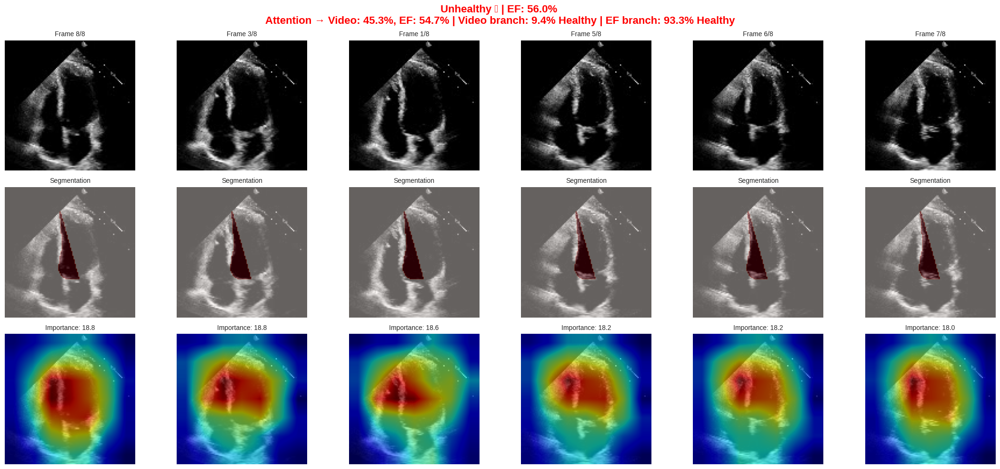

✅ Visualisation sauvegardée : gradcam_video_branch_sample_0.png

Sample #2 (Index 10)
📋 RÉSULTATS:
 EF: 61.7%
 True Label: Healthy
 Fusion Prediction: Healthy ✅
 Branche Vidéo seule prédit: Unhealthy
 Attention → Video: 65.80% | EF: 34.20%
 Confiance Video branch → Healthy: 30.94%
 Confiance EF branch → Healthy: 92.65%


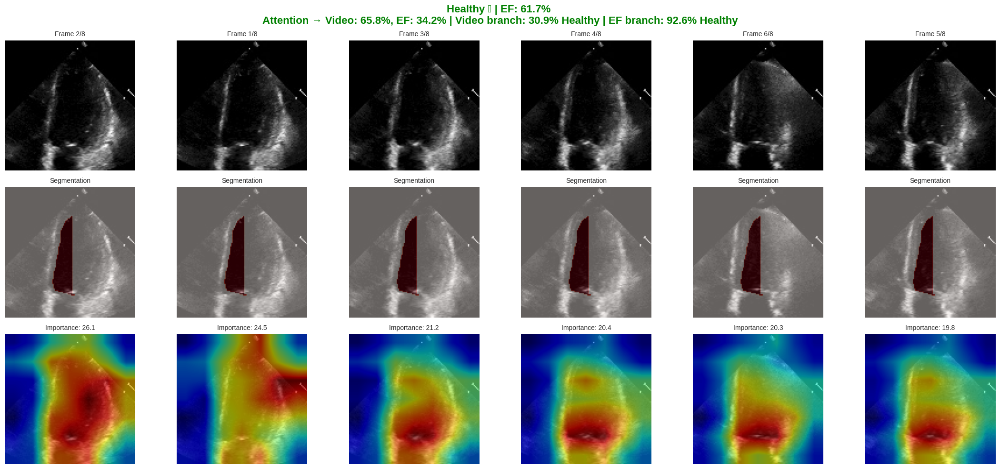

✅ Visualisation sauvegardée : gradcam_video_branch_sample_10.png

Sample #3 (Index 50)
📋 RÉSULTATS:
 EF: 31.1%
 True Label: Unhealthy
 Fusion Prediction: Unhealthy ✅
 Branche Vidéo seule prédit: Unhealthy
 Attention → Video: 1.57% | EF: 98.43%
 Confiance Video branch → Healthy: 11.06%
 Confiance EF branch → Healthy: 0.18%


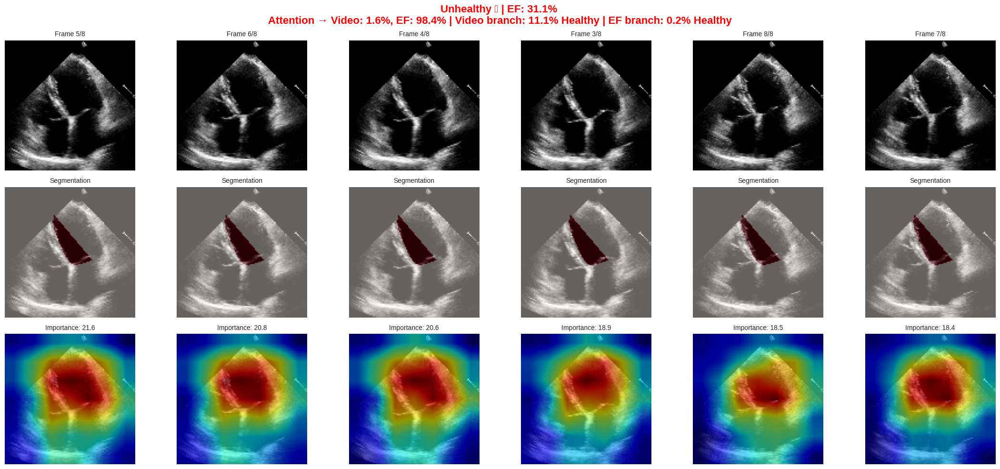

✅ Visualisation sauvegardée : gradcam_video_branch_sample_50.png

Sample #4 (Index 100)
📋 RÉSULTATS:
 EF: 58.0%
 True Label: Healthy
 Fusion Prediction: Healthy ✅
 Branche Vidéo seule prédit: Unhealthy
 Attention → Video: 51.01% | EF: 48.99%
 Confiance Video branch → Healthy: 27.07%
 Confiance EF branch → Healthy: 93.70%


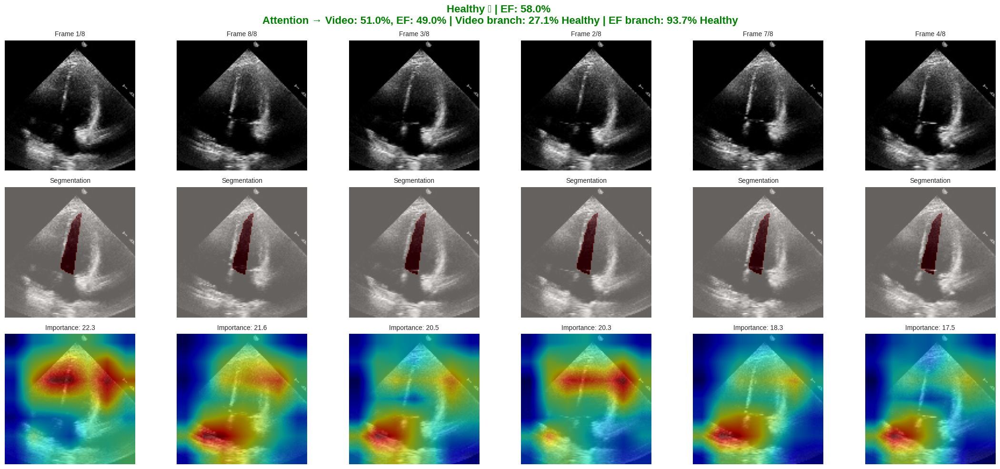

✅ Visualisation sauvegardée : gradcam_video_branch_sample_100.png

Sample #5 (Index 200)
📋 RÉSULTATS:
 EF: 59.2%
 True Label: Healthy
 Fusion Prediction: Healthy ✅
 Branche Vidéo seule prédit: Unhealthy
 Attention → Video: 54.50% | EF: 45.50%
 Confiance Video branch → Healthy: 5.11%
 Confiance EF branch → Healthy: 93.54%


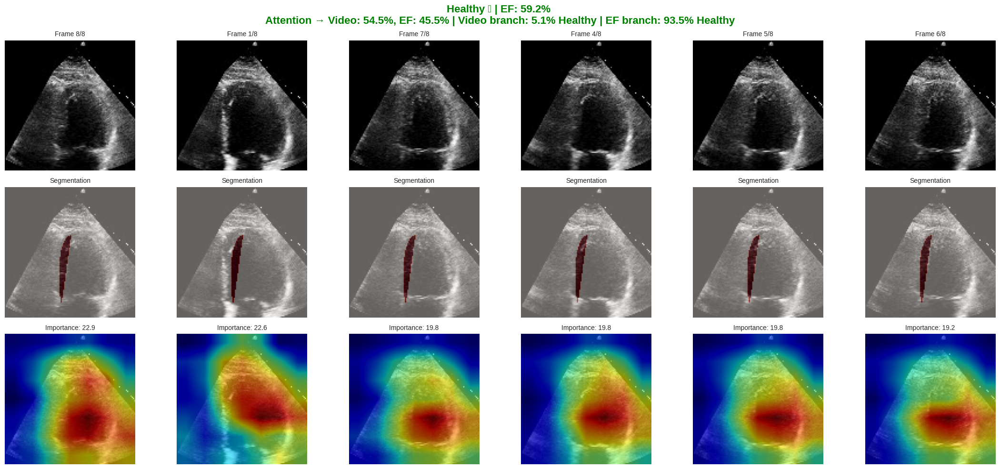

✅ Visualisation sauvegardée : gradcam_video_branch_sample_200.png

✅ TOUTES LES VISUALISATIONS SONT TERMINÉES !
📁 Fichiers sauvés avec préfixe 'gradcam_video_branch_' pour distinguer de l'ancienne version

💡 Tu peux maintenant voir les activations vidéo même sur les cas Unhealthy avec EF très bas !


In [24]:
"""
GRAD-CAM AMÉLIORÉ POUR TON MODÈLE DE FUSION
Version corrigée : Grad-CAM basé sur la branche vidéo seule
→ Permet de voir ce que la vidéo "voit" même quand l'attention donne tout à l'EF
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models.video as video_models
import numpy as np
import matplotlib.pyplot as plt
import cv2
import joblib

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("="*70)
print("🔍 GRAD-CAM AMÉLIORÉ POUR MODÈLE FUSION (branche vidéo seule)")
print("="*70)
print(f"🖥️ Device: {device}\n")

# =============================================================================
# 1. ARCHITECTURES (inchangées - copie exacte de ton code original)
# =============================================================================
class SpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.conv = nn.Conv3d(in_channels + 1, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
  
    def forward(self, features, masks):
        if masks.shape[-2:] != features.shape[-2:]:
            masks = F.interpolate(
                masks.view(masks.size(0), 1, -1, masks.size(-2), masks.size(-1)),
                size=features.shape[-3:], mode='trilinear', align_corners=False
            )
        combined = torch.cat([features, masks], dim=1)
        attention = self.sigmoid(self.conv(combined))
        return features * attention

class VideoModelWithSegmentation(nn.Module):
    def __init__(self, num_classes=2, pretrained=True, dropout=0.5):
        super().__init__()
        self.backbone = video_models.r2plus1d_18(pretrained=pretrained)
        self.backbone.stem[0] = nn.Conv3d(1, 45, kernel_size=(1,7,7),
                                          stride=(1,2,2), padding=(0,3,3), bias=False)
        self.attention = SpatialAttention(in_channels=64)
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()
      
        self.classifier = nn.Sequential(
            nn.Linear(in_features, 256), nn.ReLU(), nn.BatchNorm1d(256), nn.Dropout(dropout),
            nn.Linear(256, 128), nn.ReLU(), nn.BatchNorm1d(128), nn.Dropout(dropout*0.5),
            nn.Linear(128, num_classes)
        )
      
        self.intermediate_features = None
        def hook_fn(module, input, output):
            self.intermediate_features = output
        self.backbone.layer1.register_forward_hook(hook_fn)
  
    def forward(self, video, masks, return_features=False):
        x = video.permute(0, 2, 1, 3, 4)
        masks = masks.permute(0, 2, 1, 3, 4)
        x = self.backbone.stem(x)
        x = self.backbone.layer1(x)
        x = self.attention(x, masks)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)
        x = self.backbone.avgpool(x)
        features = x.flatten(1)
        logits = self.classifier(features)
        if return_features:
            return logits, features
        return logits

class EFBranch(nn.Module):
    def __init__(self, num_classes=2, dropout=0.5):
        super().__init__()
        self.ef_branch = nn.Sequential(
            nn.Linear(1, 64), nn.ReLU(), nn.BatchNorm1d(64), nn.Dropout(dropout),
            nn.Linear(64, 128), nn.ReLU(), nn.BatchNorm1d(128), nn.Dropout(dropout),
            nn.Linear(128, 64), nn.ReLU(), nn.BatchNorm1d(64), nn.Dropout(dropout*0.5),
            nn.Linear(64, num_classes)
        )
  
    def forward(self, ef, return_features=False):
        ef = ef.unsqueeze(1)
        if return_features:
            x = ef
            for i, layer in enumerate(self.ef_branch):
                x = layer(x)
                if i == len(self.ef_branch) - 2:
                    features = x
            logits = self.ef_branch[-1](features)
            return logits, features
        return self.ef_branch(ef)

class SoftBalancedCrossModalAttention(nn.Module):
    def __init__(self, video_dim=512, ef_dim=64, hidden_dim=128):
        super().__init__()
        self.video_proj = nn.Linear(video_dim, hidden_dim)
        self.ef_proj = nn.Linear(ef_dim, hidden_dim)
        self.attention_score = nn.Linear(hidden_dim, 1)
  
    def forward(self, video_features, ef_features):
        video_proj = self.video_proj(video_features)
        ef_proj = self.ef_proj(ef_features)
        video_score = self.attention_score(torch.tanh(video_proj))
        ef_score = self.attention_score(torch.tanh(ef_proj))
        scores = torch.cat([video_score, ef_score], dim=1)
        attention_weights = F.softmax(scores, dim=1)
        attended_video = video_features * attention_weights[:, 0:1]
        attended_ef = ef_features * attention_weights[:, 1:2]
        return attended_video, attended_ef, attention_weights

class OptimizedMultimodalFusion(nn.Module):
    def __init__(self, video_model, ef_model, num_classes=2, dropout=0.5):
        super().__init__()
        self.video_branch = video_model
        self.ef_branch = ef_model
        self.cross_attention = SoftBalancedCrossModalAttention(512, 64, 128)
        self.fusion_classifier = nn.Sequential(
            nn.Linear(576, 256), nn.ReLU(), nn.BatchNorm1d(256), nn.Dropout(dropout),
            nn.Linear(256, 128), nn.ReLU(), nn.BatchNorm1d(128), nn.Dropout(dropout*0.5),
            nn.Linear(128, 64), nn.ReLU(), nn.BatchNorm1d(64), nn.Dropout(dropout*0.25),
            nn.Linear(64, num_classes)
        )
  
    def forward(self, video, masks, ef):
        video_logits, video_features = self.video_branch(video, masks, return_features=True)
        ef_logits, ef_features = self.ef_branch(ef, return_features=True)
        attended_video, attended_ef, attention_weights = self.cross_attention(video_features, ef_features)
        fused_features = torch.cat([attended_video, attended_ef], dim=1)
        fusion_logits = self.fusion_classifier(fused_features)
        return fusion_logits, video_logits, ef_logits, attention_weights

print("✅ Architectures définies\n")

# =============================================================================
# 2. CHARGEMENT DU MODÈLE
# =============================================================================
# =============================================================================
# 2. CHARGEMENT DU MODÈLE (version corrigée pour PyTorch récent)
# =============================================================================
print("="*70)
print("📥 CHARGEMENT DU MODÈLE FUSION")
print("="*70)

video_model = VideoModelWithSegmentation(num_classes=2, pretrained=False, dropout=0.5)
ef_model = EFBranch(num_classes=2, dropout=0.5)

print("🔄 Chargement des poids avec weights_only=False (fichiers de confiance)...")

video_ckpt = torch.load('best_video_model.pth', map_location=device, weights_only=False)
video_model.load_state_dict(video_ckpt['model_state_dict'])

ef_ckpt = torch.load('best_ef_model.pth', map_location=device, weights_only=False)
ef_model.load_state_dict(ef_ckpt['model_state_dict'])

fusion_model = OptimizedMultimodalFusion(video_model, ef_model, num_classes=2, dropout=0.5).to(device)

fusion_ckpt = torch.load('best_fusion_phase1_final.pth', map_location=device, weights_only=False)
fusion_model.load_state_dict(fusion_ckpt['model_state_dict'])
fusion_model.eval()

print("✅ Modèle fusion chargé et prêt")
print(f" Val F1: {fusion_ckpt.get('val_f1', 'N/A'):.4f}")
print(f" Balance Score: {fusion_ckpt.get('balance_score', 'N/A'):.3f}")
print(f" Video Attn: {fusion_ckpt.get('video_attn', 'N/A'):.3f}")
print(f" EF Attn: {fusion_ckpt.get('ef_attn', 'N/A'):.3f}\n")

# =============================================================================
# 3. GRAD-CAM MODIFIÉ : basé sur video_logits (branche vidéo seule)
# =============================================================================
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.activations = None
      
        target_layer = model.video_branch.backbone.layer4
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_backward_hook(self._save_gradient)
  
    def _save_activation(self, module, input, output):
        self.activations = output.detach()
  
    def _save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()
  
    def generate(self, video, masks, ef):
        self.model.eval()
      
        # Forward complet
        fusion_logits, video_logits, ef_logits, attention = self.model(video, masks, ef)
        
        # On utilise la prédiction de la branche vidéo seule pour le Grad-CAM
        pred_class_video = video_logits.argmax(dim=1).item()
        
        # On garde la prédiction finale de fusion pour l'affichage
        pred_class_fusion = fusion_logits.argmax(dim=1).item()
        
        # Backward à partir des video_logits (clé du fix !)
        self.model.zero_grad()
        one_hot = torch.zeros_like(video_logits)
        one_hot[0, pred_class_video] = 1
        video_logits.backward(gradient=one_hot, retain_graph=True)
        
        # Calcul Grad-CAM
        weights = self.gradients.mean(dim=(2, 3, 4), keepdim=True)
        cam = (weights * self.activations).sum(dim=1)
        cam = F.relu(cam).squeeze(0)  # [T, H, W]
        
        cam = cam.cpu().numpy()
        for t in range(cam.shape[0]):
            frame = cam[t]
            if frame.max() > 0:
                cam[t] = (frame - frame.min()) / (frame.max() - frame.min() + 1e-8)
        
        return cam, pred_class_fusion, pred_class_video, attention.detach().cpu().numpy(), video_logits.softmax(1).detach().cpu().numpy(), ef_logits.softmax(1).detach().cpu().numpy()

def visualize_gradcam(video, masks, cam, pred_fusion, ef_value, attention, video_conf, ef_conf, save_name):
    T = cam.shape[0]
    importance = cam.reshape(T, -1).sum(axis=1)
    top_frames = np.argsort(importance)[-6:][::-1]
  
    fig, axes = plt.subplots(3, 6, figsize=(22, 10))
  
    for i, frame_idx in enumerate(top_frames):
        frame = video[0, frame_idx, 0].cpu().numpy()
       
        axes[0, i].imshow(frame, cmap='gray')
        axes[0, i].set_title(f'Frame {frame_idx+1}/{T}', fontsize=10)
        axes[0, i].axis('off')
      
        mask = masks[0, frame_idx, 0].cpu().numpy()
        axes[1, i].imshow(frame, cmap='gray')
        axes[1, i].imshow(mask, cmap='Reds', alpha=0.4)
        axes[1, i].set_title('Segmentation', fontsize=10)
        axes[1, i].axis('off')
      
        cam_frame = cv2.resize(cam[frame_idx], (frame.shape[1], frame.shape[0]))
        axes[2, i].imshow(frame, cmap='gray')
        axes[2, i].imshow(cam_frame, cmap='jet', alpha=0.6)
        axes[2, i].set_title(f'Importance: {importance[frame_idx]:.1f}', fontsize=10)
        axes[2, i].axis('off')
  
    pred_label = 'Healthy ✓' if pred_fusion == 1 else 'Unhealthy ✗'
    color = 'green' if pred_fusion == 1 else 'red'
    title = (f'{pred_label} | EF: {ef_value:.1f}% \n'
             f'Attention → Video: {attention[0,0]:.1%}, EF: {attention[0,1]:.1%} | '
             f'Video branch: {video_conf[0,1]:.1%} Healthy | EF branch: {ef_conf[0,1]:.1%} Healthy')
    plt.suptitle(title, fontsize=16, fontweight='bold', color=color)
  
    plt.tight_layout()
    plt.savefig(save_name, dpi=200, bbox_inches='tight')
    plt.show()
    print(f"✅ Visualisation sauvegardée : {save_name}\n")

# =============================================================================
# 4. APPLICATION SUR TEST SAMPLES
# =============================================================================
print("="*70)
print("🔍 APPLICATION GRAD-CAM (branche vidéo seule) SUR TEST SET")
print("="*70)

ef_scaler = joblib.load('ef_scaler_tabular.pkl')
gradcam = GradCAM(fusion_model)

# Change ici les indices que tu veux tester
test_indices = [0, 10, 50, 100, 200]  # ← Modifie cette liste comme tu veux !

print(f"\n📊 Analyse de {len(test_indices)} échantillons...\n")

for sample_idx, idx in enumerate(test_indices):
    if idx >= len(test_dataset):
        print(f"⚠️ Index {idx} hors limites (taille du test_dataset = {len(test_dataset)})")
        continue
  
    print(f"{'='*70}")
    print(f"Sample #{sample_idx+1} (Index {idx})")
    print(f"{'='*70}")
  
    sample = test_dataset[idx]
    video = sample['video'].unsqueeze(0).to(device)
    masks = sample['masks'].unsqueeze(0).to(device)
    ef = sample['ef'].unsqueeze(0).to(device)
    true_label = sample['label'].item()
  
    ef_value = ef_scaler.inverse_transform(ef.cpu().numpy().reshape(-1, 1))[0, 0]
  
    cam, pred_fusion, pred_video, attention, video_conf, ef_conf = gradcam.generate(video, masks, ef)
  
    true_label_str = 'Healthy' if true_label == 1 else 'Unhealthy'
    pred_fusion_str = 'Healthy' if pred_fusion == 1 else 'Unhealthy'
    correct = '✅' if pred_fusion == true_label else '❌'
  
    print(f"📋 RÉSULTATS:")
    print(f" EF: {ef_value:.1f}%")
    print(f" True Label: {true_label_str}")
    print(f" Fusion Prediction: {pred_fusion_str} {correct}")
    print(f" Branche Vidéo seule prédit: {'Healthy' if pred_video == 1 else 'Unhealthy'}")
    print(f" Attention → Video: {attention[0,0]:.2%} | EF: {attention[0,1]:.2%}")
    print(f" Confiance Video branch → Healthy: {video_conf[0,1]:.2%}")
    print(f" Confiance EF branch → Healthy: {ef_conf[0,1]:.2%}")
  
    save_name = f'gradcam_video_branch_sample_{idx}.png'
    visualize_gradcam(video, masks, cam, pred_fusion, ef_value, attention, video_conf, ef_conf, save_name)

print("="*70)
print("✅ TOUTES LES VISUALISATIONS SONT TERMINÉES !")
print("📁 Fichiers sauvés avec préfixe 'gradcam_video_branch_' pour distinguer de l'ancienne version")
print("\n💡 Tu peux maintenant voir les activations vidéo même sur les cas Unhealthy avec EF très bas !")
print("="*70)